In [1]:
%matplotlib inline

import re
import json
import colorsys
import numpy as np
import matplotlib.pyplot as plt

from collections import defaultdict
from collections import Counter
from itertools import groupby
from operator import itemgetter
from IPython.display import HTML as html_print

from stemmer import Stemmer


In [2]:
def colorize(word):
    if not word.isalpha(): return word, (0,0,0,0)
    if word.lower() in w2c_data_new: return word, w2c_data_new[word.lower()]
    sw = s.stem(word.lower())
    if sw in w2c_data_new: return word, w2c_data_new[sw]
    return word, (0,0,0,0)

def hslc2rgb(hslc, cw=0.5):
    h,s,l,c = hslc
    return tuple(map(lambda x:min(int(x),255),colorsys.hls_to_rgb(h,s*(1.-cw+cw*c),l*(1.-cw+cw*c))))

def cstr(s, color=(0,0,0)):
    if sum(color)>=250*3:
        return "<text style='color:rgb({}, {}, {}); background-color: rgb(0,0,0)'>{}</text>".format(color[0],color[1],color[2],s)
    return "<text style='color:rgb({}, {}, {})'>{}</text>".format(color[0],color[1],color[2],s)


def decorate(chunk):
    word, hslc = chunk
    if hslc == (0,0,0,0): return word
    return cstr(word, hslc2rgb(hslc))


In [104]:
red = [-0.014822298660874367, 122.72728890180588, -0.7012108564376831, 0.8842919515629818]
print(hslc2rgb(red))
html_print( "<b>"+decorate(('test text',red))+"</b>" )

(191, 39, 53)


In [106]:
# load 16K colored fasttext words
w2c_data = json.loads(open('colored_words.json').read())
# augment them with stems
s = Stemmer()
w2c_data_new = dict(w2c_data.items())
for w,vals in w2c_data.items():
    sw = s.stem(w)
    if sw not in w2c_data_new:
        w2c_data_new[sw] = tuple(vals[:])
w2c_data = w2c_data_new

In [107]:
def colorize(word):
    word = re.sub(r'[^a-z ]',' ',word.lower())
    if not word.isalpha(): return word, (0,0,0,0)
    if word.lower() in w2c_data_new: return word, w2c_data_new[word.lower()]
    sw = s.stem(word.lower())
    if sw in w2c_data_new: return word, w2c_data_new[sw]
    return word, (0,0,0,0)

def hslc2rgb(hslc, cw=0.5):
    h,s,l,c = hslc
    return tuple(map(lambda x:min(int(x),255),colorsys.hls_to_rgb(h,s*(1.-cw+cw*c),l*(1.-cw+cw*c))))

def cstr(s, color=(0,0,0)):
    if sum(color)>=250*3:
        return "<text style='color:rgb({}, {}, {}); background-color: rgb(0,0,0)'>{}</text>".format(color[0],color[1],color[2],s)
    return "<text style='color:rgb({}, {}, {})'>{}</text>".format(color[0],color[1],color[2],s)

def decorate(chunk):
    word, hslc = chunk
    if hslc == (0,0,0,0): return word
    return cstr(word, hslc2rgb(hslc))


In [108]:
# load book (token from the gutenberg prj)
with open('2701-0.txt', encoding='utf-8') as fh:
    raw_text = fh.read()
print(len(raw_text))
print(raw_text[:100])

1191759
CHAPTER 1. Loomings.

Call me Ishmael. Some years ago—never mind how long precisely—having
little or


In [109]:
# quick and dirty parse text to chapters

work_text = raw_text.replace('$',' ').replace('#',' ').replace('^',' ') # .replace("\n           "," ")
paragraphs = work_text.split("\n\n\n")

books_texts = defaultdict(str)
for para in paragraphs:
    idx, text = para.strip().split('\n',1)
    idx = idx.strip()
    text = re.sub(r' +',r' ',text.replace('\n\n','###').replace('\n',' ').replace('###','\n ')).strip()
    books_texts[idx] = text


In [110]:
first = itemgetter(0)

def colorize_text(text,norm=False,th=None):
    chunked_text = re.split('(\W)', text)
    colorized_chunks = [colorize(chunk) for chunk in chunked_text if chunk.strip()]
    if th is None:
        color_stats = [((6+round(chunk[1][0]/.15))%6,chunk[1][-1]) for chunk in colorized_chunks if chunk[1][-1] != 0 ]
    else:
        color_stats = [((6+round(chunk[1][0]/.15))%6,chunk[1][-1]) for chunk in colorized_chunks if chunk[1][-1] >= th ]
    color_stats = dict( (k, sum(item[1] for item in tups_to_sum)) \
                        for k, tups_to_sum in groupby(sorted(color_stats, key=first), key=first) )
    sizes = [ color_stats.get(idx, 0.) for idx in range(6) ]
    total = sum(sizes)
    if norm and total:
        sizes = [ s/float(total) for s in sizes ]
    return sizes

def colorize_chapters(idx,norm=False,th=None):
    names = []
    colors = []
    for chapter in sorted(books_texts[idx]):
        if chapter != '__full__':
            names.append( chapter )
            colors.append( colorize_text(books_texts[idx][chapter],norm=norm,th=th) )
    return names, colors

def colorize_book(idx,norm=False,th=None):
    text = books_texts[idx]
    return colorize_text(text,norm=norm,th=th)

def decorate_text(text, th=None, cw=0.5, stride=1, invert_bg = False):
#     text = re.sub(r'[^a-z ]',' ',text.lower())
    text = re.sub(r' +',' ',text)
    text = re.sub(r'^ +','',text)
    text = re.sub(r' +$','',text)
    if " " in text:
        words = text.split(" ")
    else:
        words = [text]
    result = []
    if invert_bg:
        result.append( '<p style="background-color: rgb(0,0,0)">' )
    for idx,word in enumerate(words):
        if word in w2c_data_new:
            _, color = colorize(word)
            if color == (0,0,0,0) or th is not None and color[-1]<th:
                result.append( cstr(word, (164,164,164) ) )
            else:
                result.append( cstr(word, hslc2rgb(color, cw=cw) )) #word, word2hsl[word]) ) )
        else:
            result.append( cstr(word, (164,164,164) ) )
        if '\n' in word:
            result.append('<br/><br/>')
    if invert_bg:
        result.append( '</p>' )
    return result

# print(colorize_book('CHAPTER 1. Loomings.',norm=True))
# decorate_text(books_texts['CHAPTER 1. Loomings.'])

In [111]:
books_to_show = list(books_texts.keys())
books_to_show
print(len(books_to_show))

136


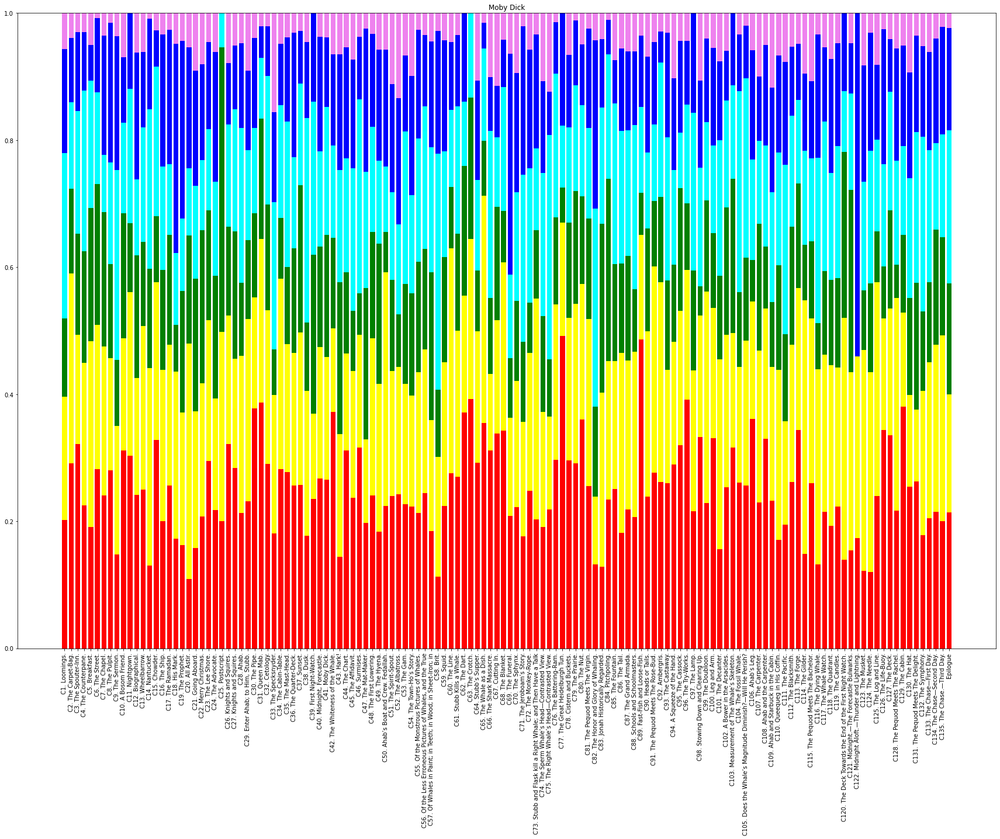

In [113]:
color_labels = ('red', 'yellow', 'green', 'cyan', 'blue', 'violet')
books_to_show = ([str(i+1) for i in range(154)])
books_to_show = list(books_texts.keys())
wanna_norm = True # False
sat_th = 0.5
colors = []
names = []
for book_idx in books_to_show:
    names.append( book_idx.replace('CHAPTER ', 'C') ) # books_names.get(book_idx, 'UNK') )
    colors.append( colorize_book(book_idx, norm=wanna_norm, th=sat_th) )

colors = np.transpose(np.array(colors))
ind = np.arange(len(books_to_show))
width = 0.75 
plts = list()

plt.figure(figsize=(30,20))
prev = None
for color_idx, color in enumerate(color_labels):
    if prev is not None:
        p = plt.bar(ind, colors[color_idx,:], width, bottom=prev, color=color)
        prev += colors[color_idx,:]
    else:
        p = plt.bar(ind, colors[color_idx,:], width, color=color)
        prev = colors[color_idx,:]
    plts.append( p[0] )
plt.ylabel('')
plt.title('Moby Dick')
plt.xticks(ind, names, rotation='vertical')
plt.show()

In [81]:
# colorize text

output = []
output.append(f'<h1>MOBY-DICK;<br><br>or, THE WHALE.</h1><h2>By Herman Melville</h2>')

for q in books_to_show:
    output.append(f'<h2>{q}</h2>')
    output.append( ' '.join(decorate_text(books_texts[q], cw=0.15, th=0.3, stride=1)) )
    
html_print("<b>"+"<br><br>".join(output)+"</b>")

In [82]:
with open('moby-dick-colorized.html', 'w', encoding='utf-8') as ofh:
    print("<br><br>".join(output), file=ofh)

In [ ]:
# xvfb-run wkhtmltopdf moby-dick-colorized.html  moby-dick-colorized.html.wkhtmltopdf.pdf

In [114]:
# select subset of colors as reduction target
choosen_colors = {
    "white": (1.0, 1.0, 1.0),
#     "blue": (0.0, 0.0, 1.0),
#     "green": (0.0, 1.0, 0.0),
    "red": (1.0, 0.0, 0.0),
#     "yellow": (1.0, 1.0, 0.0),
#     "cyan": (0.0, 1.0, 1.0),
#     "magenta": (1.0, 0.0, 1.0),
    "black": (0.0, 0.0, 0.0),
    "gray": (0.5019607843137255, 0.5019607843137255, 0.5019607843137255),
#     "brown": (0.6470588235294118, 0.16470588235294117, 0.16470588235294117),
#     "maroon": (0.5019607843137255, 0.0, 0.0),
#     "navy": (0.0, 0.0, 0.5019607843137255),
#     "orange": (1.0, 0.6470588235294118, 0.0),
#     "pink": (1.0, 0.7529411764705882, 0.796078431372549),
#     "purple": (0.5019607843137255, 0.0, 0.5019607843137255),
#     "violet": (0.9333333333333333, 0.5098039215686274, 0.9333333333333333),
}
    
def reduce_hls( color, choosen_colors ):
    best_c = None
    best_d = 1e7
    for c,d  in choosen_colors.items():
        dist = sum(map(lambda x:(x[0]-x[1])**2,zip(color,colorsys.rgb_to_hls(*d))))
        if dist<best_d:
            best_d = dist
            best_c = c 
    return best_c

def reduce_rgb( color, choosen_colors ):
    r,g,b = color
    r/=256.
    g/=256.
    b/=256.
    color = (r,g,b)
    best_c = None
    best_d = 1e7
    for c,d  in choosen_colors.items():
        dist = sum(map(lambda x:(x[0]-x[1])**2,zip(color,d)))
        if dist<best_d:
            best_d = dist
            best_c = c 
    return best_c

print(reduce_hls( (0.5,0.9,0.5), choosen_colors ))
print(reduce_rgb( (0.3,0.9,0.3), choosen_colors ))

white
black


In [115]:
def decorate_text_with_color_reduction(text, choosen_colors, th=None, cw=0.5, stride=1, invert_bg = False):
    text = re.sub(r'[^a-z ]',' ',text.lower())
    text = re.sub(r' +',' ',text)
    text = re.sub(r'^ +','',text)
    text = re.sub(r' +$','',text)
    if " " in text:
        words = text.split(" ")
    else:
        words = [text]
    result = []
    if invert_bg:
        result.append( '<p style="background-color: rgb(0,0,0)">' )
    for idx,word in enumerate(words):
        if word in w2c_data_new:
            _, color = colorize(word)
            if color == (0,0,0,0) or th is not None and color[-1]<th:
                result.append( cstr(word, (164,164,164) ) )
            else:
                reduction = choosen_colors.get( reduce_rgb( hslc2rgb(color, cw=cw), choosen_colors ) )
                result.append( cstr(word, [int(256.*x) for x in reduction] ))
        else:
            result.append( cstr(word, (164,164,164) ) )
    if invert_bg:
        result.append( '</p>' )
    return result

def colorize_text_with_color_reduction(text, choosen_colors, norm=False,th=None):
    chunked_text = re.split('(\W)', text)
    colorized_chunks = [colorize(chunk) for chunk in chunked_text if chunk.strip()]
    chunk = colorized_chunks[11]
    color_stats = Counter( [ reduce_rgb( hslc2rgb(chunk[1]), choosen_colors ) 
                for chunk in colorized_chunks if th is None and chunk[1][-1] != 0 or th is not None and chunk[1][-1] >= th])
    sizes = [ color_stats.get(idx, 0.) for idx in sorted(choosen_colors) ]
    total = sum(sizes)
    if norm and total:
        sizes = [ s/float(total) for s in sizes ]
    return sizes

def colorize_chapters_with_color_reduction(idx,choosen_colors,norm=False,th=None):
    names = []
    colors = []
    for chapter in sorted(books_texts[idx]):
        if chapter != '__full__':
            names.append( chapter )
            colors.append( colorize_text_with_color_reduction(books_texts[idx][chapter],choosen_colors,norm=norm,th=th) )
    return names, colors

def colorize_book_with_color_reduction(idx,choosen_colors,norm=False,th=None):
    text = books_texts[idx] # ['__full__']
    return colorize_text_with_color_reduction(text,choosen_colors,norm=norm,th=th)

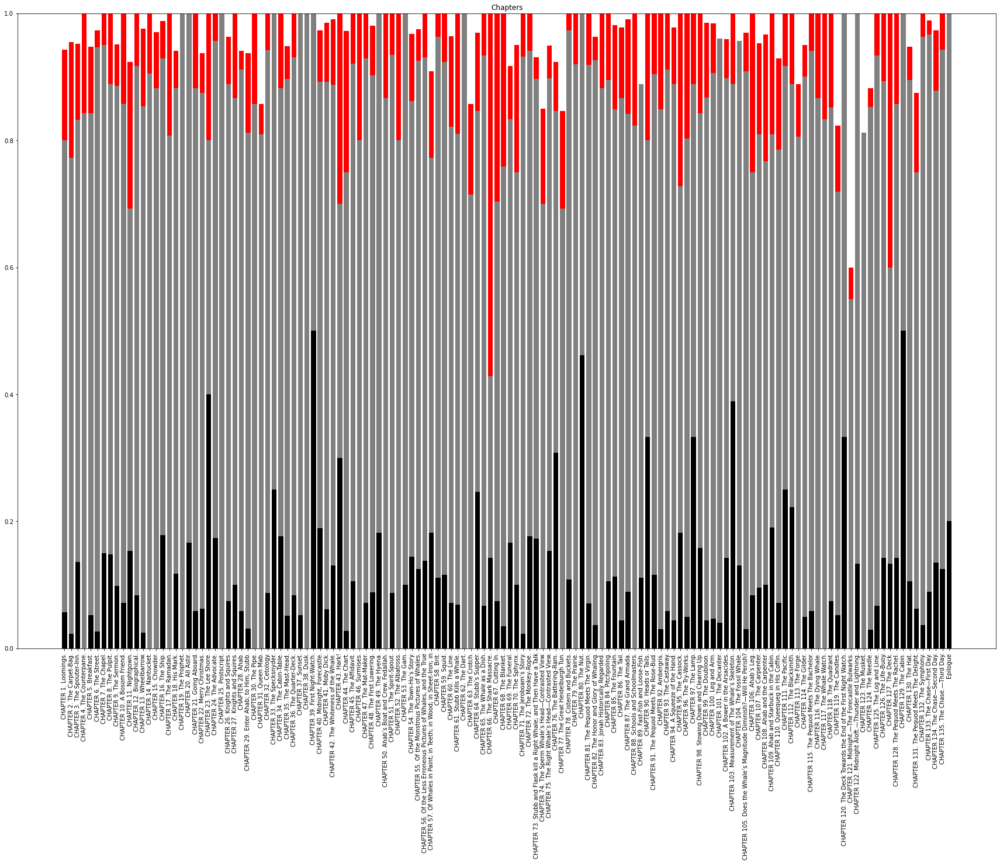

In [116]:
wanna_norm = True
sat_th = 0.85
colors = []
names = []
for book_idx in books_to_show:
    names.append( book_idx )
    colors.append( colorize_book_with_color_reduction(book_idx, choosen_colors, norm=wanna_norm, th=sat_th) )
colors = np.transpose(np.array(colors))

ind = np.arange(len(books_to_show))
width = 0.75 
plts = list()

plt.figure(figsize=(30,20))
prev = None
for color_idx, color in enumerate(list(sorted(choosen_colors.keys()))):
    if prev is not None:
        p = plt.bar(ind, colors[color_idx,:], width, bottom=prev, color=color)
        prev += colors[color_idx,:]
    else:
        p = plt.bar(ind, colors[color_idx,:], width, color=color)
        prev = colors[color_idx,:]
    # print(color_idx, color, colors[color_idx,:],p[0])
    plts.append( p[0] )
plt.ylabel('')
plt.title('Chapters')
plt.xticks(ind, names, rotation='vertical')
plt.show()